# Projeto #3 - Análise Exploratória de Dados

Antes de começar, leia as [Instruções](https://github.com/thvmm/pos-ds-ia/blob/master/projeto_3/README.md) e os [Critérios de Avaliação](https://github.com/thvmm/pos-ds-ia/blob/master/projeto_3/README.md).


### 1) **(5%)** Qual a base escolhida e qual seu interesse nela (pode ser mais de uma)? Descrição básica do conjunto de dados escolhido pelo aluno (1 parágrafo).

Estou trabalhando com informações detalhadas reais (parcialmente tratadas para evitar a identificação da empresa) de dez dias de venda de um varejo (aproximadamente 3 milhões de registros). Para exercitar, vou dividir o arquivo em VENDAS e PRODUTOS. Com base nos dados do censo de 2010, a partir do perfil de faixa etária e sexo em BH, será gerada uma base de CLIENTES proporcional ao arquivo do censo. Será criado um arquivo COMPRAS vinculando cada cliente a vários cupons de vendas, para permitir o merge. Ao final da primeira etapa, os 4 dataframes serão mesclados em um único, e as colunas DIADASEMANA e TURNO serão criadas para a investigação. Nos passos intermediários serão gerados arquivos CSV para facilitar eventual reprocessamento futuro. O tratamento inicial dos dados para evitar a identificação da empresa não foi mostrado neste trabalho (remoção de CPFCNPJ de clientes e remoção do nome da empresa dos produtos, entre outros).

O que vc espera descobrir com esse estudo?
* As pessoas fazem mais compras de segunda a sexta ou sábados e domingos? Quais os dias de maior compra?
* Em relação aos produtos ou cestas (produtos comprados juntos):
* Quais são mais vendidos em cada dia da semana?
* E no geral?
* Existe diferença entre manhã (até 11:59:59), tarde (até 17:59:59) e noite?
* Existe diferença se observarmos a idade ou sexo do cliente?


# Achei mais fácil colocar os comentários ao longo do trabalho. Análises, etapas realizadas.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
from bisect import bisect
import random
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# essa função foi útil para verificar nulos, nomes de colunas e outras informações para cada arquivo
def Descreve(nome, df):
    df.to_csv('arq_' + nome.lower() + '.csv', index=False)
    print('\n', nome)
    print('\nInformações\n', df.info)
    print('\nResumo\n', df.describe())
    # Verifica valores nulos
    print('\n', '*'*20, 'Contagem de nulos em', nome, '*'*20, '\n', df.isnull().sum())
    
# função para converter a hora da compra em turno
def Turno(hora):
    turnos = [('Manhã' , 12), ('Tarde', 18), ('Noite', 24)]
    return turnos[bisect([i[1] for i in turnos], int(hora))][0]

# função para evitar divisão por zero!
def CalculaMargem(x, y):
    try:
        return (x - y)/ x
    except:
        return 0

### 3) **(20%)** Preparação de dados

Hora de deixar a base perfeita para se trabalhar. Limpe os dados, integre com outras fontes e transforme-o para ficar pronto para se trabalhar! No fim, mostre um antes e depois de seu dataframe.

### 3.1 - Separa arquivos de produtos e vendas com base em dados reais de venda

In [2]:
# Na sequência será realizado MERGE dos dois arquivos. Somente para treinar desmembrar e juntar arquivos.

# carrega vendas de 01 a 10 de março de 2019: na verdade são mais de 3 milhões de registros, meu computador não deu conta...
# isso limitou as análises, porque buscou dados de poucos dias
n_rows = 600000
df = pd.read_csv('Venda_010319_100319.txt', sep=';', decimal=',', encoding='iso-8859-1', nrows=n_rows)

# separa arquivo de VENDAS
cols = ['DATA_VENDA', 'HORA', 'NUMERODF', 'SEQPRODUTO', 'QUANTIDADE']
df_vendas = df[cols].sort_values(cols)
df_vendas.columns = ['data', 'hora', 'cupom', 'sku', 'qtde']
df_vendas['qtde'] = df_vendas['qtde'].apply(lambda x: round(x, 2) if isinstance(x, float) else round(float(x.replace(',', '.')), 2))

# trata campos NaN - excluir
#df_vendas.dropna(inplace=True)

Descreve('Vendas', df_vendas)


 Vendas

Informações
 <bound method DataFrame.info of                               data  hora   cupom     sku  qtde
293578  2019-03-01-00.00.00.000000     6   19188   22150  1.00
293579  2019-03-01-00.00.00.000000     6   24069   15451  0.57
229662  2019-03-01-00.00.00.000000     6   96124   83874  1.00
229663  2019-03-01-00.00.00.000000     6   96125  131267  1.00
229664  2019-03-01-00.00.00.000000     6   97069    5104  1.00
...                            ...   ...     ...     ...   ...
540743  2019-03-02-00.00.00.000000    22  222095  124379  1.00
540738  2019-03-02-00.00.00.000000    22  222095  202963  1.00
540744  2019-03-02-00.00.00.000000    23   26909     451  1.00
540745  2019-03-02-00.00.00.000000    23   26909  146714  4.00
540746  2019-03-02-00.00.00.000000    23   26909  186246  1.30

[600000 rows x 5 columns]>

Resumo
                 hora          cupom            sku           qtde
count  600000.000000  600000.000000  600000.000000  600000.000000
mean       14.075903

In [3]:
# separa arquivo de PRODUTOS
df['DESCRICAO'] = df['DESCRICAO'].str.lower()
df['DESCRICAO'] = df['DESCRICAO'].str.replace('oba', '')
df['DESCRICAO'] = df['DESCRICAO'].str.strip()
campos = ['SEQPRODUTO', 'DESCRICAO', 'VALOR', 'CUSTO_LIQUIDO_CALCULADO']
df_produtos = df[campos].sort_values(campos).drop_duplicates(keep='last')
df_produtos.drop_duplicates(subset=['DESCRICAO'], keep='last', inplace=True)
df_produtos.drop_duplicates(subset=['SEQPRODUTO'], keep='last', inplace=True)
df_produtos.columns = ['sku', 'produto', 'preco', 'custo']
df_produtos['preco'] = df_produtos['preco'].apply(lambda x: round(x, 2) if isinstance(x, float) else round(float(x.replace(',', '.')), 2))
df_produtos['custo'] = df_produtos['custo'].apply(lambda x: round(x, 2) if isinstance(x, float) else round(float(x.replace(',', '.')), 2))

df_produtos['margem'] = [CalculaMargem(x, y) * 100 for x, y in zip(df_produtos['preco'], df_produtos['custo'])]

# trata campos NaN - excluir
df_produtos.dropna(inplace=True)

Descreve('Produtos', df_produtos)


 Produtos

Informações
 <bound method DataFrame.info of            sku                                      produto  preco  custo  \
319760      66                            abobora italia kg   9.93   2.55   
565989      68                                    acelga un   9.98   1.79   
296662      72                                 beterraba kg   9.21   1.52   
583219      74                                    cebola kg   9.98   2.32   
295789      75                         cebola p conserva kg   8.24   4.18   
...        ...                                          ...    ...    ...   
342616  204870                         salsicha eder c alho  12.07  17.15   
390062  204872                      salsicha aperitivo eder   9.57  17.15   
382973  204874  mexilhao desconchado premier pesc cong 400g  29.99  14.52   
328515  204877      file pescada premier pesc bca cong 400g  65.98  17.10   
435409  204886                pate alcachofra it sacla 190g  17.99   9.14   

           margem 

### 3.2 - Cria arquivo de clientes com base no censo de BH (2010)

In [4]:
# Fonte; https://censo2010.ibge.gov.br/sinopse/webservice/frm_piramide.php?codigo=310620&corhomem=3d4590&cormulher=9cdbfc

# busca dados da população de BH, censo de 2010 (dados da fonte acima repassados para o Excel)
df_bh = pd.read_excel('bh_faixa_etaria.xlsx')

# filtra idade dos clientes entre 20 e 79 anos
faixas = ['20 a 24 anos', '25 a 29 anos', '30 a 34 anos', '35 a 39 anos', '40 a 44 anos', '45 a 49 anos', '50 a 54 anos', '55 a 59 anos', '60 a 64 anos', '65 a 69 anos', '70 a 74 anos', '75 a 79 anos']
df_bh = df_bh[df_bh['faixa_etaria'].isin(faixas)]

# cria lista com população de BH separada por faixa etária e sexo
lista_populacao = list()
for linha, i in zip(df_bh.T.to_dict().items(), range(len(df_bh))):
    lista_populacao.append([linha[1]['faixa_etaria'], 'male', linha[1]['homem']])
    lista_populacao.append([linha[1]['faixa_etaria'], 'female', linha[1]['mulher']])

# cria dataframe da população para gráfico
df_populacao = pd.DataFrame(lista_populacao, columns=['faixa_etaria', 'sexo', 'total'])
df_populacao['percentual'] = df_populacao['total'] / df_populacao['total'].sum()
df_populacao['origem'] = 'populacao'
df_populacao

,faixa_etaria,sexo,total,percentual,origem
0,20 a 24 anos,male,106240,0.062596,populacao
1,20 a 24 anos,female,112538,0.066307,populacao
2,25 a 29 anos,male,110707,0.065228,populacao
3,25 a 29 anos,female,120055,0.070736,populacao
4,30 a 34 anos,male,102211,0.060223,populacao
5,30 a 34 anos,female,111603,0.065756,populacao
6,35 a 39 anos,male,84424,0.049742,populacao
7,35 a 39 anos,female,94405,0.055623,populacao
8,40 a 44 anos,male,78564,0.046290,populacao
9,40 a 44 anos,female,90757,0.053474,populacao


In [5]:
# cria dataframe da amostra para gráfico: proporcionalidade
tamamanho_amostra = 1000
df_amostra = df_populacao[['faixa_etaria', 'sexo', 'percentual']]
df_amostra['total'] = round(df_amostra['percentual'] * tamamanho_amostra).astype(int)
df_amostra['origem'] = 'cliente proporcionalidade'

# cria dataframe de clientes
lista_clientes = list()
for indice, linha in df_amostra.iterrows():
    for i in range(linha['total']):
        lista_clientes.append(['Cliente ' + str(indice+1) + '-' + str(i+1), linha['faixa_etaria'], linha['sexo']])

df_clientes = pd.DataFrame(lista_clientes, columns=['nome', 'faixa_etaria', 'sexo'])
Descreve('Clientes', df_clientes)


 Clientes

Informações
 <bound method DataFrame.info of                nome  faixa_etaria    sexo
0       Cliente 1-1  20 a 24 anos    male
1       Cliente 1-2  20 a 24 anos    male
2       Cliente 1-3  20 a 24 anos    male
3       Cliente 1-4  20 a 24 anos    male
4       Cliente 1-5  20 a 24 anos    male
...             ...           ...     ...
996   Cliente 24-10  75 a 79 anos  female
997   Cliente 24-11  75 a 79 anos  female
998   Cliente 24-12  75 a 79 anos  female
999   Cliente 24-13  75 a 79 anos  female
1000  Cliente 24-14  75 a 79 anos  female

[1001 rows x 3 columns]>

Resumo
                 nome  faixa_etaria    sexo
count           1001          1001    1001
unique          1001            12       2
top     Cliente 1-53  25 a 29 anos  female
freq               1           136     540

 ******************** Contagem de nulos em Clientes ******************** 
 nome            0
faixa_etaria    0
sexo            0
dtype: int64


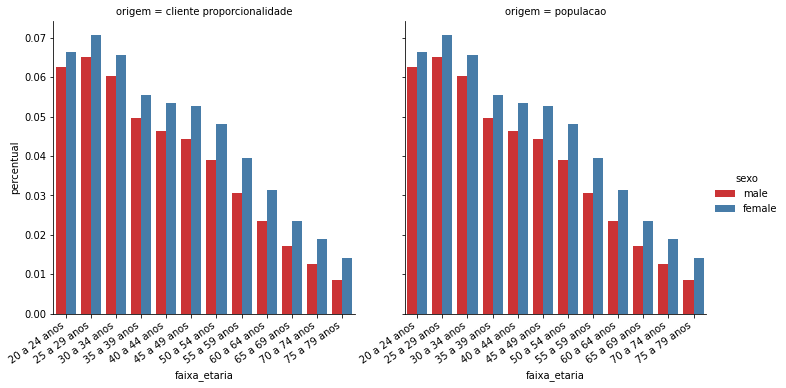

In [6]:
# cria gráfico amostra
df_grafico = pd.concat([df_amostra, df_populacao])
grafico = sns.catplot(data=df_grafico, x='faixa_etaria', y='percentual', kind='bar', hue='sexo', palette='Set1', col='origem')
grafico.set_xticklabels(rotation=35, horizontalalignment='right')

df_clientes.to_csv('arq_clientes.csv', index=False)

### 3.3 - Concatena Vendas e Produtos

In [7]:
df_vendas = pd.read_csv('arq_vendas.csv') #, nrows=10000)
df_produtos = pd.read_csv('arq_produtos.csv') #, nrows=10000)

df_completo = pd.merge(df_vendas, df_produtos, how='inner', on='sku').sort_values(['data', 'hora', 'cupom', 'produto'])

# cria novas colunas
df_completo['lucro'] = df_completo['preco'] - df_completo['custo']

for campo in ['preco', 'custo', 'lucro']:
  df_completo[campo + '_total'] = df_completo['qtde'] * df_completo[campo]

df_completo['data'] = df_completo['data'].str[:10]
df_completo['dia_semana'] = pd.to_datetime(df_completo['data']).dt.day_name()

df_completo['horario'] = [Turno(x) for x in df_completo['hora']]

# corrige formatos e caracteres especiais
df_completo['cupom'] = df_completo['cupom'].astype('str')
df_completo['produto'] = df_completo['produto'].str.replace('&', '-').replace('/', '')

Descreve('Completo', df_completo)


 Completo

Informações
 <bound method DataFrame.info of               data  hora   cupom     sku  qtde  \
0       2019-03-01     6   19188   22150  1.00   
3       2019-03-01     6   24069   15451  0.57   
8563    2019-03-01     6   96124   83874  1.00   
8637    2019-03-01     6   96125  131267  1.00   
8647    2019-03-01     6   97069    5104  1.00   
...            ...   ...     ...     ...   ...   
230305  2019-03-02    22  222095    2762  0.48   
442524  2019-03-02    22  222095    4975  1.00   
488349  2019-03-02    23   26909     451  1.00   
580779  2019-03-02    23   26909  186246  1.30   
402336  2019-03-02    23   26909  146714  4.00   

                                  produto  preco  custo      margem  lucro  \
0                         lc comp morango   0.01   0.00  100.000000   0.01   
3                             pao frances   9.98   6.51   34.769539   3.47   
8563                       crisantemo mix  75.96   9.00   88.151659  66.96   
8637    coalhada verde campo l

### 3.4 - Atribui clientes a cupons de venda

In [8]:
df_clientes = pd.read_csv('arq_clientes.csv') #, nrows=10000)

# atribui clientes a cupons
cupons = df_completo[['cupom']].groupby('cupom')

clientes = list()
for cupom, indices in cupons.groups.items():
    # RANDOM>CHOICE - processo totalmente aleatório, não permite conclusões sensatas...
    clientes.append([cupom, random.choice(df_clientes['nome'])])  
clientes = pd.DataFrame(clientes, columns=['cupom', 'nome'])

# concatena dataframe completo com nome do cliente
df_completo = pd.merge(df_completo, clientes, how='inner', on='cupom')

# totaliza cupons
total_cupons = df_completo[['cupom', 'preco_total']].groupby('cupom').sum().reset_index()
total_cupons.columns = ['cupom', 'total_cupom']
total_cupons['total_cupom'] = round(total_cupons['total_cupom'], 2)

# concatena dataframe completo com valor total do cupom
df_completo = pd.merge(df_completo, total_cupons, how='inner', on='cupom')

# concatena dataframe completo (vendas MERGE produtos) com clientes
df_completo = pd.merge(df_completo, df_clientes, how='inner', on='nome')
#print(df_completo)

Descreve('Completo', df_completo)


 Completo

Informações
 <bound method DataFrame.info of               data  hora  cupom     sku  qtde  \
0       2019-03-01     6  19188   22150  1.00   
1       2019-03-01    12  19188    1808  0.66   
2       2019-03-01    12  19188  181870  1.00   
3       2019-03-01    12  19188    2471  1.00   
4       2019-03-01    12  19188    2780  0.08   
...            ...   ...    ...     ...   ...   
583047  2019-03-02    21  80055     376  0.33   
583048  2019-03-02    21  80055    3604  2.00   
583049  2019-03-02    21  80055     127  0.27   
583050  2019-03-02    21  80055   18658  1.00   
583051  2019-03-02    21  80055   14253  1.00   

                                                  produto  preco  custo  \
0                                         lc comp morango   0.01   0.00   
1                                        banana nanica kg   9.98   2.33   
2       mac la molisana fusilloni super ext di lusso 500g  35.97   4.92   
3                                        mostarda maco

In [9]:
# cria completo por cupom
df_completo_cupons = df_completo[['data', 'hora', 'cupom', 'dia_semana', 'horario', 'nome', 'total_cupom', 'faixa_etaria', 'sexo']].drop_duplicates()

Descreve('Completo_cupons', df_completo_cupons)


 Completo_cupons

Informações
 <bound method DataFrame.info of               data  hora   cupom dia_semana horario          nome  \
0       2019-03-01     6   19188     Friday   Manhã  Cliente 3-53   
1       2019-03-01    12   19188     Friday   Tarde  Cliente 3-53   
6       2019-03-01    16   19188     Friday   Tarde  Cliente 3-53   
8       2019-03-02     9   19188   Saturday   Manhã  Cliente 3-53   
24      2019-03-01     7  108985     Friday   Manhã  Cliente 3-53   
...            ...   ...     ...        ...     ...           ...   
583021  2019-03-02    17   96582   Saturday   Tarde  Cliente 6-27   
583034  2019-03-02    20   55583   Saturday   Noite  Cliente 6-27   
583041  2019-03-02    20  105538   Saturday   Noite  Cliente 6-27   
583046  2019-03-02    20  109611   Saturday   Noite  Cliente 6-27   
583047  2019-03-02    21   80055   Saturday   Noite  Cliente 6-27   

        total_cupom  faixa_etaria    sexo  
0            407.79  25 a 29 anos    male  
1            407.79

### 4) **(30%)** Análise

Com seu dado pronto, é hora de fazer a parte mais legal: investigar e responder nossas hipoteses. Elas se confirmam? Em quais cenários? Existe alguma forma de perceber isso no mundo real? Dica: Abuse das técnicas de visualização.

Ex: Ainda no contexto dos exemplos do item 2). Ao investigar a hipotese relacionada ao padrão de compra, percebi que em todos os meses existia uma diferença entre dia util e final de semana. Porém notei que Fevereiro possui um comportamento diferente, o que poderia explicar? Talvez o carnaval e seus feriados.

Ex2: Talvez eu descubra que alguns finais de semana possuam um comportamento diferente dos dias de semana e outros não. Por que não são todos? Nessa investigação você pode acabar descobrindo que os finais de semana que são diferentes, coincidem no fato de serem os primeiros dias utéis, o que pode remeter ao fato de boa parte das empresas realizarem pagamentos nessa parte do mês.

In [10]:
# Implemente sua análise aqui. Use mais blocos se achar que ficará mais organizado.
fig = px.scatter(df_produtos[df_produtos['margem'] > -1000], x='preco', y='margem', title='Preço x Margem', color='custo', size='preco', hover_data=['produto'], range_y=[df_produtos[df_produtos['margem'] > -1000]['margem'].min()*1.1, 110])
fig.show()

# Esse gráfico ficou interessante para mostrar os produtos com preço menor que o custo.
# ESsa informação exigiu o detalhamento dos dados com algum especialista, pois a princípio os dados originais vieram de um PDV, e nÃo seria o caso de erros de digitação...

In [11]:
df_produtos[df_produtos['margem'] <= -1000].sort_values(['margem'])

# a análise inicial mostrou produtos em promoçÃo ou perto da data de vencimento.
# o caso mais estranho foi da máquina de café, com custo alto (162.22) em relaçÃo ao preço (0.01). Na verdade, a promoção era "compre X produtos e leve a máquina de brinde"

,sku,produto,preco,custo,margem
8579,181343,maq deltaq qool evolution verm 127v,0.01,162.62,-1.626100e+06
4625,72339,bisc sta farina leite ninho kg,0.40,31.75,-7.837500e+03
4080,25570,confeito borussia kg banana,0.45,26.97,-5.893333e+03
3560,20550,lc cha sabores xicara,4.99,282.10,-5.553307e+03
5277,130400,framboesa bdj kg,9.95,165.00,-1.558291e+03


In [12]:
df_produtos.describe()

,sku,preco,custo,margem
count,9717.000000,9717.000000,9717.000000,9.717000e+03
mean,88485.359473,25.444733,10.416466,-1.238753e+02
std,75159.783073,32.558713,14.150259,1.649708e+04
min,66.000000,0.010000,0.000000,-1.626100e+06
25%,9959.000000,8.150000,3.050000,4.195535e+01
50%,97654.000000,9.990000,6.050000,5.708155e+01
75%,154158.000000,32.970000,12.450000,7.708380e+01
max,204886.000000,989.430000,282.100000,1.000000e+02


In [13]:
# verifica distribuição das vendas por dia da semana e sexo
fig = px.violin(df_completo_cupons, x='dia_semana', y='total_cupom', title='Total Cupom x Idade', color='sexo')
fig.show()

# A princípio alguns valores chamaram a atençao por estarem bem longe da média, e de um valor mais "comum" para despesas de supermercado (valores acima de 10 mil reais)
# O levantamento permitiu concluir que alguns clientes (principalmente restaurantes) fazem compras diárias e acertam uma vez por semana, gerando um valor alto como se fosse uma única compra

In [14]:
df_completo_cupons.sort_values(['total_cupom'], ascending=False)

,data,hora,cupom,dia_semana,horario,nome,total_cupom,faixa_etaria,sexo
161904,2019-03-01,17,185729,Friday,Tarde,Cliente 20-14,54788.10,65 a 69 anos,female
199482,2019-03-01,12,13275,Friday,Tarde,Cliente 20-3,51927.27,65 a 69 anos,female
338707,2019-03-02,13,52195,Saturday,Tarde,Cliente 9-17,25007.52,40 a 44 anos,male
338687,2019-03-02,10,52195,Saturday,Manhã,Cliente 9-17,25007.52,40 a 44 anos,male
509740,2019-03-01,10,185614,Friday,Manhã,Cliente 6-59,13286.64,30 a 34 anos,female
...,...,...,...,...,...,...,...,...,...
501791,2019-03-01,16,119669,Friday,Tarde,Cliente 2-11,0.10,20 a 24 anos,female
380400,2019-03-01,21,126455,Friday,Noite,Cliente 13-3,0.10,50 a 54 anos,male
463291,2019-03-02,11,74508,Saturday,Manhã,Cliente 3-16,0.10,25 a 29 anos,male
16497,2019-03-01,20,119756,Friday,Noite,Cliente 15-17,0.10,55 a 59 anos,male


In [15]:
df_completo[df_completo['total_cupom'] > 10000]

# No detalhamento foram identificadas as compras acima de 10 mil.
# Alguns valores estranhos ainda precisavam de análise, como 448.53 pelo quilo de carne suína, mas não houve tempo para esse detalhamento

,data,hora,cupom,sku,qtde,produto,preco,custo,margem,lucro,preco_total,custo_total,lucro_total,dia_semana,horario,nome,total_cupom,faixa_etaria,sexo
161904,2019-03-01,17,185729,21614,61.87,carre suino,448.53,6.45,98.561969,442.08,27750.5511,399.0615,27351.4896,Friday,Tarde,Cliente 20-14,54788.10,65 a 69 anos,female
161905,2019-03-01,17,185729,8464,10.00,costela suina salgada,9.60,12.03,-25.312500,-2.43,96.0000,120.3000,-24.3000,Friday,Tarde,Cliente 20-14,54788.10,65 a 69 anos,female
161906,2019-03-01,17,185729,76919,40.00,file mignon suino,325.20,7.15,97.801353,318.05,13008.0000,286.0000,12722.0000,Friday,Tarde,Cliente 20-14,54788.10,65 a 69 anos,female
161907,2019-03-01,17,185729,8595,25.00,ling aurora calab defumada,9.96,10.30,-3.413655,-0.34,249.0000,257.5000,-8.5000,Friday,Tarde,Cliente 20-14,54788.10,65 a 69 anos,female
161908,2019-03-01,17,185729,8656,50.00,ling aurora toscana cod.401,9.98,8.81,11.723447,1.17,499.0000,440.5000,58.5000,Friday,Tarde,Cliente 20-14,54788.10,65 a 69 anos,female
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495191,2019-03-01,19,24242,170565,1.00,ovos granbiagi bco gde polpa 12un,9.98,3.40,65.931864,6.58,9.9800,3.4000,6.5800,Friday,Noite,Cliente 8-53,12124.83,35 a 39 anos,female
495192,2019-03-01,19,24242,7047,0.13,q mus scala ral kg,9.90,16.96,-71.313131,-7.06,1.2870,2.2048,-0.9178,Friday,Noite,Cliente 8-53,12124.83,35 a 39 anos,female
495193,2019-03-01,19,24242,144341,1.00,suco suvalan s acucar 1l uva,8.99,4.37,51.390434,4.62,8.9900,4.3700,4.6200,Friday,Noite,Cliente 8-53,12124.83,35 a 39 anos,female
495194,2019-03-01,19,24242,24971,1.00,vagem manteiga 300g,95.84,1.89,98.027963,93.95,95.8400,1.8900,93.9500,Friday,Noite,Cliente 8-53,12124.83,35 a 39 anos,female


In [16]:
# verifica distribuição das vendas por faixa etária e sexo
fig = px.violin(df_completo_cupons[df_completo_cupons['total_cupom'] < 10000].sort_values('faixa_etaria'), x='faixa_etaria', y='total_cupom', title='Total Cupom x Idade', color='sexo')
fig.show()

# A distribuição por sexo, eliminados os cupons de mais de 10 mil, pode ser interessante para análise gerencial, mas nesse caso os dados de clientes foram aleatórios e nÃo permitem nenhuma conclusão

In [17]:
# verifica distribuição das vendas por faixa etária e sexo
fig = px.violin(df_completo_cupons[df_completo_cupons['total_cupom'] < 10000].sort_values('faixa_etaria'), x='faixa_etaria', y='total_cupom', title='Total Cupom x Dia', color='dia_semana')
fig.show()

# o mesmo vale para as compras por faixa etária e dia da semana. Dado o grande colume de dados, não foi possível fazer a comparação entre diversos dias da semana

### 5) Modelagem 30%

Agora você terá mais uma oportunidade de mostrar o que você aprendeu durante o módulo 2 quanto a modelagem de dados e criação de modelos. Utilizando os dados preparados na seção 1 e após a análise feita na seção 2 você deverá:
1. **Defina um problema de regressão ou classificação que envolva uma variável dos seus dados.**

In [18]:
# O código rodou... está no final do arquivo. Mas interpretar os resultados são outros 500... realmente não consegui ainda aprofundar no estudo dos modelos.
# Ainda estou avançando em relação ao tratamento dos dados, mas senti um desenvolvimento muito grande nessa parte inicial.
# Os gráficos e alguns procedimentos desse trabalho estão sendo incorporados em uma ferramenta comercial simples
# Hoje está bem mais confortável trabalhar com CSV e bancos de dados para tratamento, a ideia geral do projeto está clara, mas ainda não consigo dedicar todo o tempo que gostaria para o estudo do conteúdo apresentado no curso.
# Falta de tempo (interesse existe, e muito!), necessidade de aprofundamento no estudo dos modelos, uso de arquivo muito grande para a capacidade da máquina foram fatores que comprometeram a qualidade final do trabalho: praticamente nenhuma das questões porpostas foram respondidas...
# Por um lado, o trabalho agregou muito valor pela proximidade com minha atuação profissional; por outro, buscarei arquivos menores e tentarei antecipar ao máximo o início do trabalho, já adiantando bem a parte de tratamento, para tirar mais proveito dos modelos

***---> Agrupar produtos vendidos juntos (cesta).***

2. **Realize ao menos 2 técnicas de processamento e seleção de features.**
    * Isto inclui, normalização, PCA, e técnicas de seleção de features como information gain. Seja criativo pois está parte é crucial para seu modelo. Você pode escolhar manualmente as features desde que seja justificada na seção 2 (parte de Análise).


3. **Defina uma métrica para avaliar o seu modelo.**
    * Por exemplo, você pode utilizar MAE (Mean Absolute Error) para um problema de regressão. Ou, F1-Score para um problema de classificação. Há varias métricas, então escolha sabiamente.


***---> Comente brevemente sua decisão aqui.***

4. **Divida seus dados em 2 conjuntos. Um de treino e outro conjunto de teste.**
    * Treine e otimize seu modelo no conjunto de treino e apenas use o conjunto de teste para apresentar os resultados finais.


5. **Treine um ou mais modelos de ML para o seu problema.**
    * Escolha 1 ou mais tipos de classificadores ou regressores dependendo do seu problema.
    * Por exemplo, TreeClassifier para um problema de classificação. 
    * Use cross-validation e outras técnicas como GridSearch e ou RandomizedSearch para encontrar os melhores parametros para o seu modelo.


6. **Apresente (com visualizações) os resultados do seu modelo mostrando que ele é melhor do que um baseline não aleatório.**
    * Para o baseline, você pode escolher um modelo bem trivial mas não aleatório. Por exemplo, para um problema de classificação um baseline pode ser a classe mais presente caso o conjunto de dados seja desbalanceado.  Um modelo mais simples também pode ser utilizado como baseline, por exemplo, você escolheu um Random Forest Classifier, e comparou os resultados um Logistic Regression. Você pode até mesmo escolher um modelo de AutoML(como TPOT) como Baseline.

### 6) Conclusões **10%**

*Partindo das suas hipoteses e investigações, o que você consegue concluir? Suas hipoteses se concretizaram?*

In [19]:
# comprados junto
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori

cupons = df_completo[['cupom', 'produto']].sort_values('cupom').groupby('cupom')

compras = list()
for cupom, indices in cupons.groups.items():
    juntos = list()
    for indice in indices:
        juntos.append(df_completo['produto'].iloc[indice])
    compras.append(juntos)
print('Compras', len(compras))

compras_mais_1 = list()
for compra in compras:
    if len(compra) > 1:
        compras_mais_1.append(compra)
print(len('Compras com no mínimo 2', compras_mais_1))

Compras 59486


TypeError: len() takes exactly one argument (2 given)

In [20]:
te = TransactionEncoder()
te_ary = te.fit(compras).transform(compras)
df_transaction = pd.DataFrame(te_ary, columns=te.columns_)
df_transaction.shapete = TransactionEncoder()
te_ary = te.fit(compras).transform(compras)
df_transaction = pd.DataFrame(te_ary, columns=te.columns_)
df_transaction.shape

(59486, 9717)

In [21]:
frequent_itemsets = apriori(df_transaction, min_support=0.01, use_colnames=True)
frequent_itemsets

In [1]:
from mlxtend.frequent_patterns import fpmax
max_itemsets = fpmax(df_transaction, min_support=0.01, use_colnames=True)
max_itemsets

NameError: name 'df_transaction' is not defined

In [2]:
from mlxtend.frequent_patterns import association_rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=0.0001)
rules

NameError: name 'frequent_itemsets' is not defined

In [3]:
rules = association_rules(frequent_itemsets, metric="leverage", min_threshold=0.001)
rules

NameError: name 'frequent_itemsets' is not defined

In [4]:
rules["antecedent_len"] = rules["antecedents"].apply(lambda x: len(x))
rules

NameError: name 'rules' is not defined

In [5]:
rules[ (rules['antecedent_len'] >= 0.7) &
       (rules['confidence'] > 0.75) &
       (rules['lift'] > 1) ]

NameError: name 'rules' is not defined

In [6]:
import matplotlib.pyplot as plt
rules = association_rules(frequent_itemsets, metric="support", min_threshold=0.007)
scores = rules[['confidence', 'lift']].values
#print(scores)

x = rules['confidence'].values
y = rules['lift'].values

plt.scatter(x, y)
plt.xlabel('confidence')
plt.ylabel('lift')
plt.show()

NameError: name 'frequent_itemsets' is not defined

In [7]:
def identify_pareto(scores):
    # Count number of items
    population_size = scores.shape[0]
    # Create a NumPy index for scores on the pareto front (zero indexed)
    population_ids = np.arange(population_size)
    # Create a starting list of items on the Pareto front
    # All items start off as being labelled as on the Parteo front
    pareto_front = np.ones(population_size, dtype=bool)
    # Loop through each item. This will then be compared with all other items
    for i in range(population_size):
        # Loop through all other items
        for j in range(population_size):
            # Check if our 'i' pint is dominated by out 'j' point
            if all(scores[j] >= scores[i]) and any(scores[j] > scores[i]):
                # j dominates i. Label 'i' point as not on Pareto front
                pareto_front[i] = 0
                # Stop further comparisons with 'i' (no more comparisons needed)
                break
    # Return ids of scenarios on pareto front
    return population_ids[pareto_front]

pareto = identify_pareto(scores)
print ('Pareto front index vales')
print ('Points on Pareto front: \n',pareto)

pareto_front = scores[pareto]
print ('\nPareto front scores')
print (pareto_front)

NameError: name 'scores' is not defined

In [8]:
pareto_front_df = pd.DataFrame(pareto_front)
pareto_front_df.sort_values(0, inplace=True)
pareto_front = pareto_front_df.values

x_all = scores[:, 0]
y_all = scores[:, 1]
x_pareto = pareto_front[:, 0]
y_pareto = pareto_front[:, 1]

plt.scatter(x_all, y_all)
plt.plot(x_pareto, y_pareto, color='r')
plt.xlabel('confidence')
plt.ylabel('lift')
plt.show()

NameError: name 'pd' is not defined